In [1]:
from sympy.physics.quantum import TensorProduct
from sympy.physics.quantum import Dagger
from sympy.physics.quantum import qapply
from sympy.physics.quantum import InnerProduct
from sympy.physics.quantum import Ket, Bra
from sympy.physics.quantum import Operator
from sympy.physics.quantum.qubit import Qubit, QubitBra, measure_all, measure_partial
import sympy
from sympy import Matrix
from IPython.core.display import display_pretty

from sympy.physics.quantum.gate import X,Y,Z,H,S,T,CNOT,SWAP,CPHASE,CGateS,UGate,PhaseGate,IdentityGate
from sympy.physics.quantum.qapply import qapply
from sympy.physics.quantum.qubit import matrix_to_qubit, Qubit
from sympy.physics.quantum.qubit import IntQubit
from sympy.physics.quantum.trace import Tr
from sympy.physics.quantum.represent import represent

In [2]:
eps = sympy.Symbol('ε')
t = sympy.Symbol('t')
b1, b2 = sympy.symbols('b1 b2')
H_ab = b1*Matrix(Z(0)*IdentityGate(1)) + b2*Z(1)
H_I = eps*X(0)*X(1)
H = H_ab + H_I
U = (sympy.exp(-1j*H*t))

TypeError: 
Data type not understood; expecting list of lists or lists of values.

In [ ]:
U

exp(-1.0*I*t*(b1*Z(0) + b2*Z(1) + ε*X(0)*X(1)))

In [ ]:
state = Tr(qapply(U*Qubit('00')), [0])
represent(state, basis=Z(0), nqubits=1)

Tr(exp(-1.0*I*b1*t*Z(0) - 1.0*I*b2*t*Z(1) - 1.0*I*t*ε*X(0)*X(1))*|00>)

In [ ]:
represent(X(1), basis=Z(0), nqubits=2)

Matrix([
[0, 0, 1, 0],
[0, 0, 0, 1],
[1, 0, 0, 0],
[0, 1, 0, 0]])

In [1]:
from qiskit.quantum_info import Statevector, DensityMatrix, random_density_matrix
from qiskit.quantum_info import Operator, Pauli, partial_trace, SparsePauliOp
from qiskit.visualization import plot_histogram, plot_state_city
from qiskit.circuit.library.pauli_evolution import PauliEvolutionGate
from qiskit import QuantumCircuit
from qiskit.circuit import Parameter
import numpy as np

In [2]:
projection = (DensityMatrix.from_label('1').expand(DensityMatrix(np.eye(2)))).data
state = DensityMatrix(np.random.rand(4,4))
state = state + state.conjugate()
state = state/2
state = state/state.trace()
state = partial_trace(projection @ state.data, [0])
state.trace().real

0.3570794767672416

In [8]:
def time_evolution(state, t, b, eps):
    state = DensityMatrix.from_label('0').expand(state)
    hamiltonian = SparsePauliOp(data = ['ZI', 'IZ', 'XX'], coeffs = [1, b, eps])
    unitary = PauliEvolutionGate(hamiltonian, t)
    # projection = (DensityMatrix.from_label('1').expand(DensityMatrix(np.eye(2)))).data
    state = state.evolve(unitary)
    # state = partial_trace(projection @ state.data, [0])
    state = partial_trace(state, [0])
    prob = state.trace()
    state = state/prob
    return state, prob

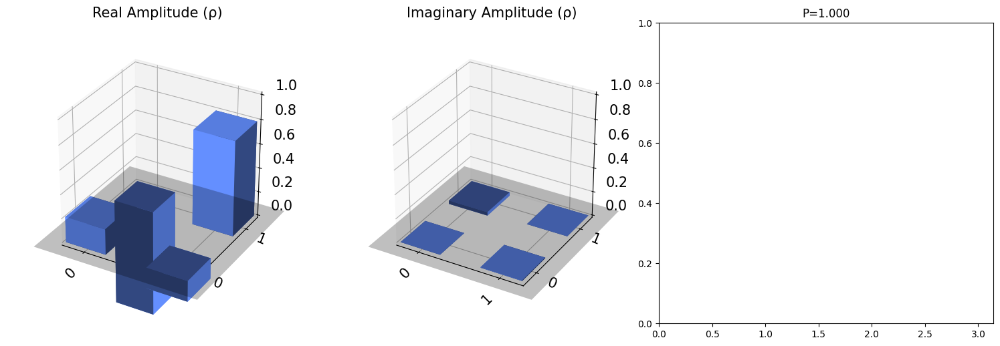

In [9]:
from matplotlib import animation
from IPython.display import HTML
import matplotlib.pyplot as plt

FRAMES = 100

fig = plt.figure(figsize=(15, 5))
ax1 = fig.add_subplot(1, 3, 1, projection='3d')
ax2 = fig.add_subplot(1, 3, 2, projection='3d')
ax3 = fig.add_subplot(1, 3, 3)
ax1.set_title('Logic')
ax2.set_title('Environment')
# ax3.set_title('Reset')
ax1.set_zlim3d(0, 1)
ax2.set_zlim3d(0, 1)
ax3.set_ylim(0, 1)

# plot_state_city(reset, ax_real=ax3);

states = []
probs = []
times = np.linspace(1e-5, np.pi, FRAMES)
interval = np.mean(np.diff(times))
initial_state = random_density_matrix(2)

for i, t in enumerate(times):
    states.append(state)
    state, prob = time_evolution(states[0], t=t, b=1, eps=1)
    probs.append(prob.real)

def update(frame, states, probs, times):
    ax1.clear()
    ax2.clear()
    ax3.clear()
    plot_state_city(states[frame], ax_real=ax1, ax_imag=ax2)
    ax3.scatter(times[:frame], probs[:frame], c='r', s=1)

    ax1.set_zlim3d(0, 1)
    ax2.set_zlim3d(0, 1)
    ax3.set_ylim(0, 1)
    ax3.set_xlim(0, np.pi)
    ax3.set_title('P={:.3f}'.format(probs[frame]))
    return ax1, ax2

ani = animation.FuncAnimation(fig, update, frames=FRAMES, fargs=(states, probs, times), interval=100, blit=False)
HTML(ani.to_jshtml())

In [21]:
states[3]

DensityMatrix([[ 0.56708822+3.00392894e-18j, -0.16178478+3.19919980e-01j],
               [-0.16178478-3.19919980e-01j,  0.43291178-3.00392894e-18j]],
              dims=(2,))


In [ ]:
eps = sympy.Symbol('ε')
t = sympy.Symbol('t')
b1, b2 = sympy.symbols('b1 b2')
hamiltonian = Matrix(Pauli('ZI')) + b2 * Matrix(Pauli('IZ')) + eps * Matrix(Pauli('XX'))
unitary = sympy.exp(-1j*hamiltonian*t)
unitary_dg = unitary.adjoint()

In [ ]:
state = Matrix(initial_state.data)
state

Matrix([
[0, 0,   0, 0],
[0, 0,   0, 0],
[0, 0, 1.0, 0],
[0, 0,   0, 0]])

In [ ]:
unitary @ state @ unitary_dg

Matrix([
[0,                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            